In [142]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# import cv2
from tqdm import tqdm 
%matplotlib inline


# Method 1: Visualizing WSI as Scatterplot
This will give us some crude sense of the WSI

In [31]:
patch_info=pd.read_pickle("/dartfs/rc/nosnapshots/V/VaickusL-nb/EDIT_Students/users/Sophie_Chen/scc_tumor_data/prelim_patch_info_v2/14_A2b_ASAP_tumor_map.pkl")

In [32]:
patch_info

,ID,x,y,patch_size,annotation,y_true,inflamm,scc
0,14_A2b_ASAP,1792,20992,256,0,0,0,0
1,14_A2b_ASAP,1792,21248,256,0,0,0,0
2,14_A2b_ASAP,1792,21504,256,0,0,0,0
3,14_A2b_ASAP,1792,21760,256,0,0,0,0
4,14_A2b_ASAP,2048,20736,256,0,0,0,0
...,...,...,...,...,...,...,...,...
14775,14_A2b_ASAP,81664,18688,256,0,0,0,0
14776,14_A2b_ASAP,81664,18944,256,0,0,0,0
14777,14_A2b_ASAP,81920,16896,256,0,0,0,0
14778,14_A2b_ASAP,81920,17152,256,0,0,0,0


In [33]:
xs = []
ys = []
for row in patch_info[['y','x']].values.tolist():
    ys.append(row[0]/6)
    xs.append(row[1]/6)

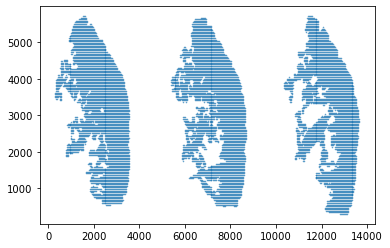

In [36]:
plt.scatter(xs,ys, s=0.3, alpha=0.7)
plt.show()

KeyError: 0

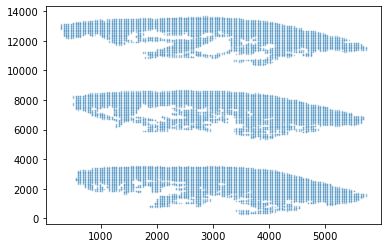

In [35]:
# plt.scatter(*(patch_info[['y','x']].values/6).T.tolist(),s=0.5,alpha=0.3)
# plt.imshow(patch_info[0])
# sophie original code 

# Method 2: Stich Patches together and Resize Down 
Here we can get a more detailed understanding of the WSI 
Notes:
- So there are essentially missing patches, and no small number
- Concat approach takes too long. Instead, should just make the big array, and copy down pixels accordingly

In [40]:
WSI = np.load("/dartfs/rc/nosnapshots/V/VaickusL-nb/EDIT_Students/users/Sophie_Chen/scc_tumor_data/prelim_patch_info/14_A2b_ASAP_tumor_map.npy")

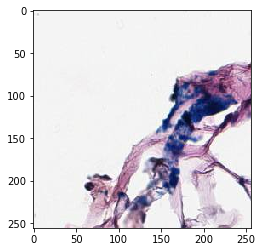

In [44]:
plt.imshow(WSI[0], interpolation='nearest')

In [57]:
p1 = WSI[0]
p2 = WSI[1]
p3 = WSI[2]

In [58]:
p_c = np.concatenate((p1, p2, p3), axis=1)

In [59]:
p_c.shape

(256, 768, 3)

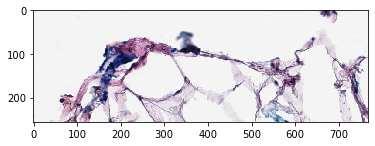

In [60]:
plt.imshow(p_c, interpolation='nearest')

In [62]:
print(min(patch_info["x"]), max(patch_info["x"]))

1792 81920


In [63]:
print(min(patch_info["y"]), max(patch_info["y"]))

1792 34304


In [68]:
(max(patch_info["x"]) - min(patch_info["x"]))/256

313.0

In [69]:
(max(patch_info["y"]) - min(patch_info["y"]))/256

127.0

In [70]:
313*127

39751

In [73]:
patch_info.head(10)

,ID,x,y,patch_size,annotation,y_true,inflamm,scc
0,14_A2b_ASAP,1792,20992,256,0,0,0,0
1,14_A2b_ASAP,1792,21248,256,0,0,0,0
2,14_A2b_ASAP,1792,21504,256,0,0,0,0
3,14_A2b_ASAP,1792,21760,256,0,0,0,0
4,14_A2b_ASAP,2048,20736,256,0,0,0,0
5,14_A2b_ASAP,2048,20992,256,0,0,0,0
6,14_A2b_ASAP,2048,21248,256,0,0,0,0
7,14_A2b_ASAP,2048,21504,256,0,0,0,0
8,14_A2b_ASAP,2048,21760,256,0,0,0,0
9,14_A2b_ASAP,2048,22016,256,0,0,0,0


In [89]:
# map every row of the original df to it's corresponding patch 
patch_dic = {} # (x,y) -> patch np array 

In [90]:
for idx, row in patch_info.iterrows():
    h = (row["x"], row["y"])
    patch_dic[h] = WSI[idx]

In [146]:
# supp maps that help decide whether there is anything in a given row 
row_map = {}
for (x,y) in patch_dic:
    row_map[x] = True

In [147]:
len(row_map)

233

In [105]:
patch_info = patch_info.sort_values(by = ["x", "y"], ascending=True)

In [104]:
patch_info

,ID,x,y,patch_size,annotation,y_true,inflamm,scc
3,14_A2b_ASAP,1792,21760,256,0,0,0,0
2,14_A2b_ASAP,1792,21504,256,0,0,0,0
1,14_A2b_ASAP,1792,21248,256,0,0,0,0
0,14_A2b_ASAP,1792,20992,256,0,0,0,0
16,14_A2b_ASAP,2048,23808,256,0,0,0,0
...,...,...,...,...,...,...,...,...
14761,14_A2b_ASAP,81664,14592,256,0,0,0,0
14760,14_A2b_ASAP,81664,14336,256,0,0,0,0
14779,14_A2b_ASAP,81920,17408,256,0,0,0,0
14778,14_A2b_ASAP,81920,17152,256,0,0,0,0


In [148]:
p_t = []

In [149]:
g_it = 0
for x in tqdm(range(min(patch_info["x"]), max(patch_info["x"]), 256)):
    p_c = None
    if row_map[x]: #if this row has non-white space
        l_it = 0
        for y in range(min(patch_info["y"]), max(patch_info["y"]), 256): #all xs are the same here, so we concat along axis = 1 (col)
            if (x,y) in patch_dic:
                if l_it == 0:
                    p_c = patch_dic[(x,y)]
                else:
                    p_c = np.concatenate((p_c, patch_dic[(x,y)]), axis=1)

            else:
                #append whitespace 
                p = np.full((256,256,3), 255)
                if l_it == 0: 
                    p_c = p 
                else:
                    p_c = np.concatenate((p_c, p), axis=1)
            l_it += 1
        if g_it == 0:
            p_t = p_c
        else:
            p_t = np.concatenate((p_t, p_c), axis=0)
    else: #all whitespace
        pc = p = np.full((256,32512,3), 255)
    g_it += 1

 16%|█████████████████████████▉                                                                                                                                            | 49/313 [06:45<36:23,  8.27s/it]


KeyboardInterrupt: 

In [150]:
p_t.shape

(12544, 32512, 3)

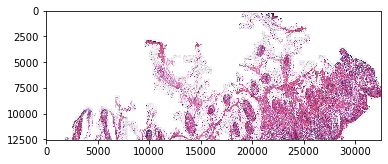

In [152]:
plt.imshow(p_t, interpolation='nearest')

In [135]:
print(np.any([1]))

True


In [164]:
# different approach

WSI = np.full( ((max(patch_info["x"]) - min(patch_info["x"])), (max(patch_info["y"]) - min(patch_info["y"])), 3), 255)

In [165]:
WSI.shape

(80128, 32512, 3)

In [166]:
WSI[0].shape

(32512, 3)

In [167]:
min_x = min(patch_info["x"])
min_y = min(patch_info["y"])

max_x = max(patch_info["x"])
max_y = max(patch_info["y"])

In [168]:
for x in tqdm(range(min_x, max_x, 256)):
    for y in range(min_y, max_y, 256): 
       #treat these as corner coordinates, and fill in 256*256 from corner 
        if (x,y) in patch_dic:
            patch = patch_dic[(x,y)]
            for i in range(len(patch)):
                for j in range(len(patch[i])):
                    WSI[x - min_x + i][y - min_y + j] = patch[i][j]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 313/313 [12:41<00:00,  2.43s/it]


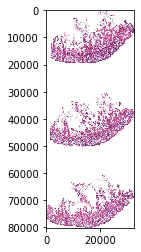

In [169]:
plt.imshow(WSI, interpolation='nearest')

In [170]:
plt.savefig('14_A2b_ASAP.png')

<Figure size 432x288 with 0 Axes>

In [186]:
from PIL import Image as im
from IPython.display import Image 

In [176]:
WSI.shape

(80128, 32512, 3)

In [193]:
WSI[8324][0]

array([255, 255, 255])

In [199]:
image = im.fromarray(WSI.astype('uint8'), "RGB")

In [200]:
width, height = image.size

In [201]:
width, height

(32512, 80128)

In [202]:
new_image = image.resize((int(width/15), int(height/15)))

In [203]:
new_image.size

(2167, 5341)

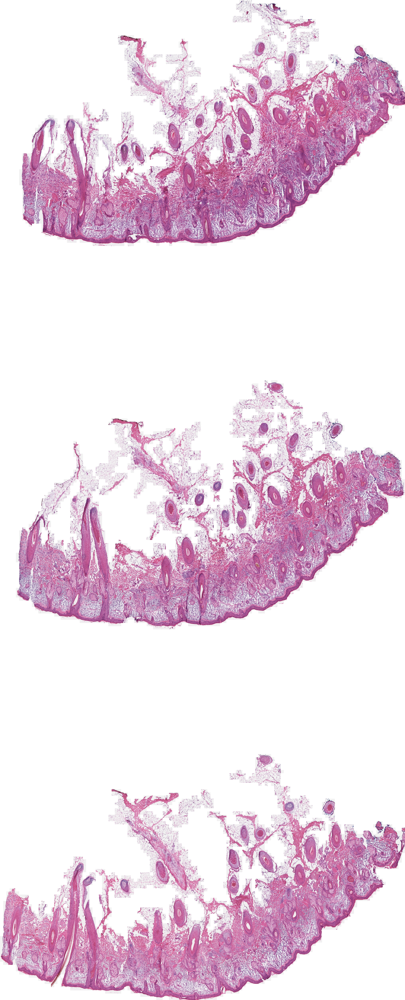

In [204]:
display(new_image)

In [188]:
# pil_img = Image(WSI)
# display(pil_img)

KeyboardInterrupt: 